In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf



In [2]:
df=pd.read_csv("bitcoin.csv")
df.head()

,Date,Open,High,Low,Close,Volume,Month,Day,Year,Daily_Return,7-day MA,30-day MA,30-day Volatility
0,2015-01-01,320.434998,320.434998,314.002991,314.248993,8036550,1,1,2015,NaN,NaN,NaN,NaN
1,2015-01-02,314.079010,315.838989,313.565002,315.032013,7860650,1,2,2015,0.002492,NaN,NaN,NaN
2,2015-01-03,314.846008,315.149994,281.082001,281.082001,33054400,1,3,2015,-0.107767,NaN,NaN,NaN
3,2015-01-04,281.145996,287.230011,257.612000,264.195007,55629100,1,4,2015,-0.060079,NaN,NaN,NaN
4,2015-01-05,265.084015,278.341003,265.084015,274.473999,43962800,1,5,2015,0.038907,NaN,NaN,NaN


In [3]:
df.drop(columns=['Month','Day','Year','Daily_Return','7-day MA','30-day MA','30-day Volatility'],inplace=True)


In [4]:
df['Adj Close'] = df['Close']


In [5]:
df.head()

,Date,Open,High,Low,Close,Volume,Adj Close
0,2015-01-01,320.434998,320.434998,314.002991,314.248993,8036550,314.248993
1,2015-01-02,314.079010,315.838989,313.565002,315.032013,7860650,315.032013
2,2015-01-03,314.846008,315.149994,281.082001,281.082001,33054400,281.082001
3,2015-01-04,281.145996,287.230011,257.612000,264.195007,55629100,264.195007
4,2015-01-05,265.084015,278.341003,265.084015,274.473999,43962800,274.473999


In [6]:
df.shape

(3560, 7)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3560 entries, 0 to 3559
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3560 non-null   object 
 1   Open       3560 non-null   float64
 2   High       3560 non-null   float64
 3   Low        3560 non-null   float64
 4   Close      3560 non-null   float64
 5   Volume     3560 non-null   int64  
 6   Adj Close  3560 non-null   float64
dtypes: float64(5), int64(1), object(1)
memory usage: 194.8+ KB


In [8]:
df.describe()

,Open,High,Low,Close,Volume,Adj Close
count,3560.000000,3560.000000,3560.000000,3560.000000,3.560000e+03,3560.000000
mean,18478.936191,18897.642920,18033.468855,18496.101743,1.817609e+10,18496.101743
std,19812.379499,20252.700123,19333.106905,19823.924102,1.919850e+10,19823.924102
min,176.897003,211.731003,171.509995,178.102997,7.860650e+06,178.102997
25%,2379.564941,2507.847534,2287.572571,2392.270081,9.848245e+08,2392.270081
50%,9377.975098,9549.722656,9232.566406,9381.900879,1.475210e+10,9381.900879
75%,29812.612793,30345.909668,29282.421387,29838.826172,2.908641e+10,29838.826172
max,73079.375000,73750.070312,71334.093750,73083.500000,3.509679e+11,73083.500000


In [9]:
df.tail()

,Date,Open,High,Low,Close,Volume,Adj Close
3555,2024-09-25,64302.589844,64804.503906,62945.375000,63143.144531,25078377700,63143.144531
3556,2024-09-26,63138.546875,65790.796875,62669.269531,65181.019531,36873129847,65181.019531
3557,2024-09-27,65180.664062,66480.695312,64852.992188,65790.664062,32058813449,65790.664062
3558,2024-09-28,65792.179688,66255.531250,65458.035156,65887.648438,15243637984,65887.648438
3559,2024-09-29,65888.898438,66069.343750,65450.015625,65635.304688,14788214575,65635.304688


In [10]:
# Initialize a flag to track if all values are the same
all_same = True

# Check if the 'Close' and 'Adj Close' values are the same for each row
for i in range(len(df)):
    if df['Close'][i] != df['Adj Close'][i]:
        all_same = False
        break

# Drop 'Adj Close' if all values are the same
if all_same:
    df = df.drop(columns='Adj Close')

# Display the updated DataFrame
df.head()

,Date,Open,High,Low,Close,Volume
0,2015-01-01,320.434998,320.434998,314.002991,314.248993,8036550
1,2015-01-02,314.079010,315.838989,313.565002,315.032013,7860650
2,2015-01-03,314.846008,315.149994,281.082001,281.082001,33054400
3,2015-01-04,281.145996,287.230011,257.612000,264.195007,55629100
4,2015-01-05,265.084015,278.341003,265.084015,274.473999,43962800


In [11]:
# Convert the 'Date' column from object type to datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Check the data type of the 'Date' column after conversion
print(df['Date'].dtype)

datetime64[ns]


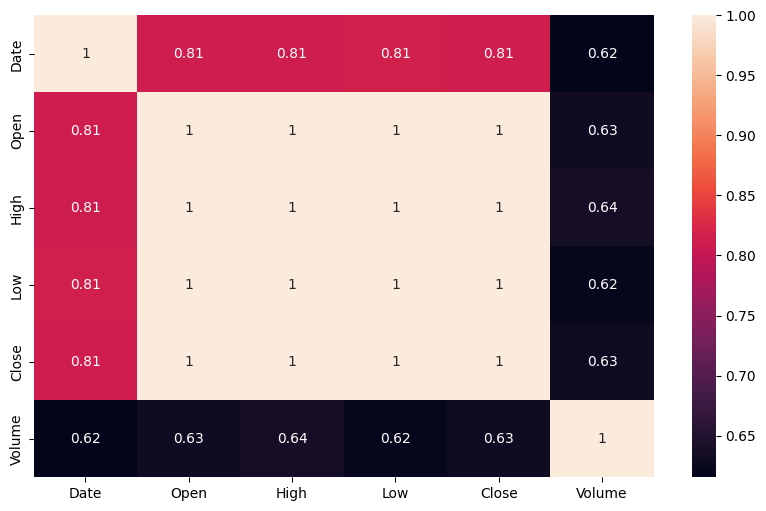

In [12]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [13]:
print(df['Date'].dtype)


datetime64[ns]


In [14]:
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Year'] = df['Date'].dt.year

In [15]:
df.head()

,Date,Open,High,Low,Close,Volume,Month,Day,Year
0,2015-01-01,320.434998,320.434998,314.002991,314.248993,8036550,1,1,2015
1,2015-01-02,314.079010,315.838989,313.565002,315.032013,7860650,1,2,2015
2,2015-01-03,314.846008,315.149994,281.082001,281.082001,33054400,1,3,2015
3,2015-01-04,281.145996,287.230011,257.612000,264.195007,55629100,1,4,2015
4,2015-01-05,265.084015,278.341003,265.084015,274.473999,43962800,1,5,2015


In [16]:
df['Year'].unique()

array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024],
      dtype=int32)

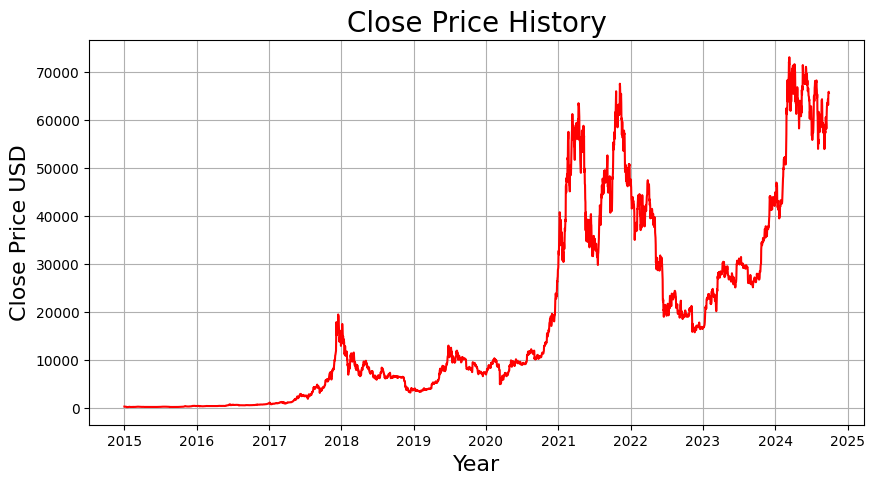

In [17]:
#plotting the data
plt.figure(figsize=(10,5))
plt.title('Close Price History',fontsize=20)
plt.plot(df['Date'],df['Close'], color='r')
plt.xlabel('Year', fontsize=16)
plt.ylabel('Close Price USD', fontsize = 16)
plt.grid(True)
plt.show()

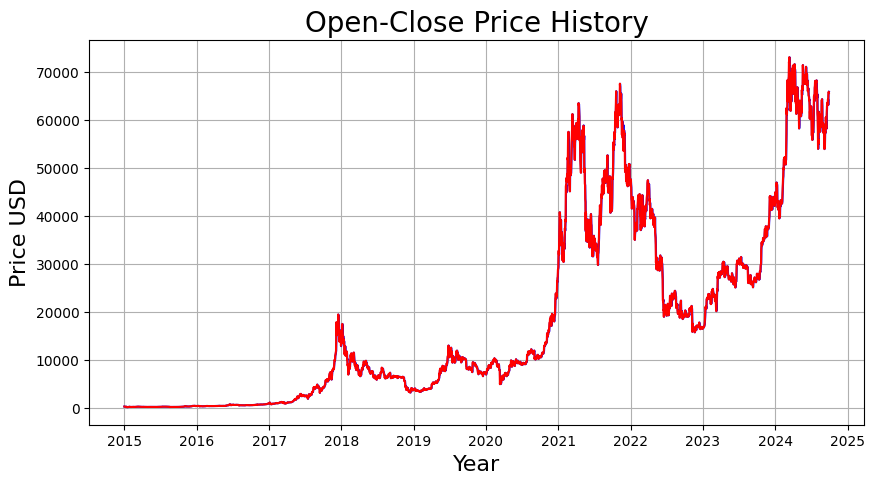

In [18]:
#plotting the data
plt.figure(figsize=(10,5))
plt.title('Open-Close Price History',fontsize=20)
plt.plot(df['Date'],df['Open'], color='b')
plt.plot(df['Date'],df['Close'], color='r')
plt.xlabel('Year', fontsize=16)
plt.ylabel('Price USD', fontsize = 16)
plt.grid(True)
plt.show()

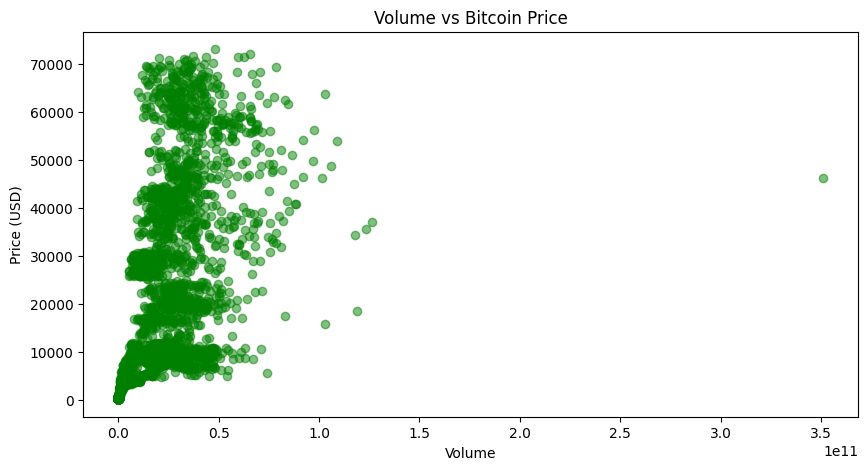

In [19]:
plt.figure(figsize=(10,5))
plt.scatter(df['Volume'], df['Close'], alpha=0.5, color='g')
plt.title('Volume vs Bitcoin Price')
plt.xlabel('Volume')
plt.ylabel('Price (USD)')
plt.show()

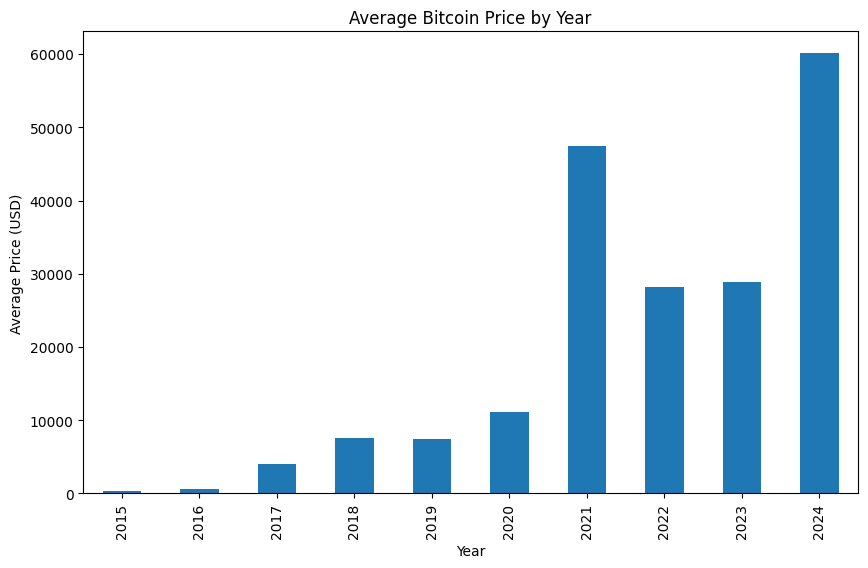

In [20]:
monthly_mean = df.groupby('Year')['Close'].mean()

plt.figure(figsize=(10,6))
monthly_mean.plot(kind='bar')
plt.title('Average Bitcoin Price by Year')
plt.xlabel('Year')
plt.ylabel('Average Price (USD)')
plt.show()

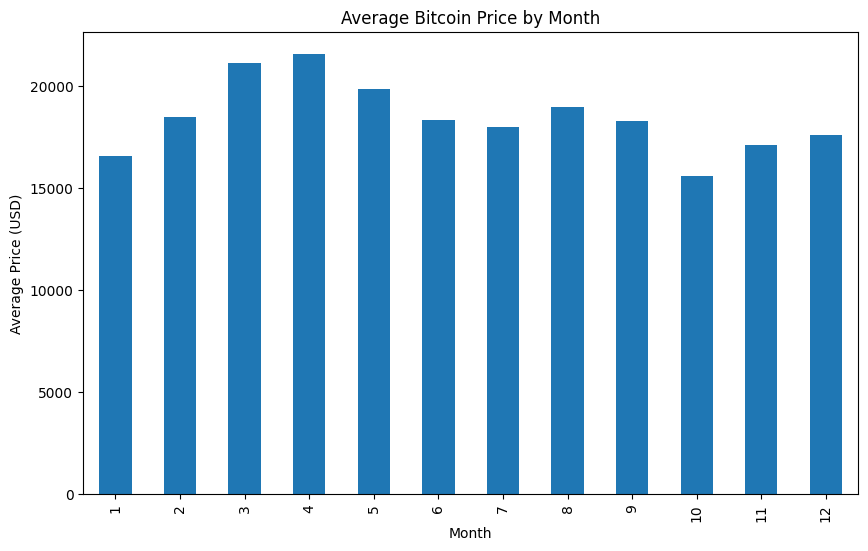

In [21]:
# Group by month to check seasonality
monthly_mean = df.groupby('Month')['Close'].mean()

plt.figure(figsize=(10,6))
monthly_mean.plot(kind='bar')
plt.title('Average Bitcoin Price by Month')
plt.xlabel('Month')
plt.ylabel('Average Price (USD)')
plt.show()

In [22]:
gb_year=df.groupby("Year")


df_2015=gb_year.get_group(2015)
df_2016=gb_year.get_group(2016)
df_2017=gb_year.get_group(2017)
df_2018=gb_year.get_group(2018)
df_2019=gb_year.get_group(2019)
df_2020=gb_year.get_group(2020)
df_2021=gb_year.get_group(2021)
df_2022=gb_year.get_group(2022)
df_2023=gb_year.get_group(2023)
df_2024=gb_year.get_group(2024)

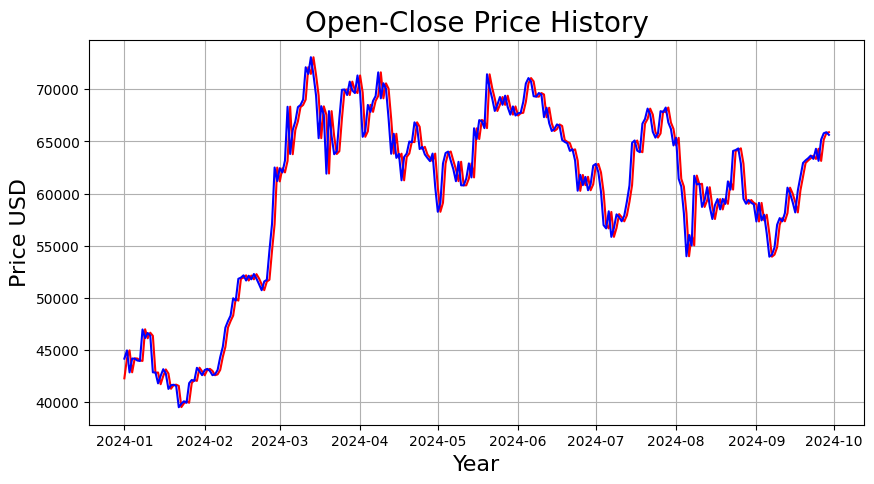

In [23]:
#plotting the data
plt.figure(figsize=(10,5))
plt.title('Open-Close Price History',fontsize=20)
plt.plot(df_2024['Date'],df_2024['Open'], color='r')
plt.plot(df_2024['Date'],df_2024['Close'], color='b')
plt.xlabel('Year', fontsize=16)
plt.ylabel('Price USD', fontsize = 16)
plt.grid(True)
plt.show()

In [24]:
# Group the data by 'Year' and 'Month'
monthly_avg = df.groupby(['Year', 'Month'])['Close'].mean().unstack(level=0)
monthly_avg

Year,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
Month,,,,,,,,,,
1,248.782547,410.844485,914.916159,13085.558090,3701.554963,8389.270476,34761.649950,41114.422379,20250.717490,42919.612399
2,234.153645,404.408274,1062.533672,9472.001151,3711.907261,9630.722185,46306.798968,40763.474051,23304.539202,49875.174300
3,269.042259,416.525774,1129.365228,9040.557097,3976.069100,6871.016113,54998.008695,41966.237525,25116.900895,67702.439264
4,235.491534,434.339398,1206.641007,8033.596631,5178.469434,7224.477327,57206.720052,41435.319661,28857.574544,65882.380599
5,236.997001,461.954415,1895.383529,8450.997732,7309.694131,9263.151745,46443.286668,31706.105217,27499.307145,65266.317288
6,238.081766,642.869061,2636.204346,6793.507666,9415.900179,9489.227214,35845.154687,24383.685482,27763.198437,65899.465755
7,279.563740,661.356103,2519.418386,7146.349987,10669.336158,9589.899729,34444.973790,21539.253843,30057.469947,62804.542087
8,250.733805,579.585197,3880.989998,6700.129946,10643.248362,11652.394185,45709.022681,22366.266318,27852.792843,59921.197581
9,233.595533,605.848633,4064.836312,6610.675033,9814.067871,10660.276855,45939.771484,19804.779232,26306.136393,60256.068157


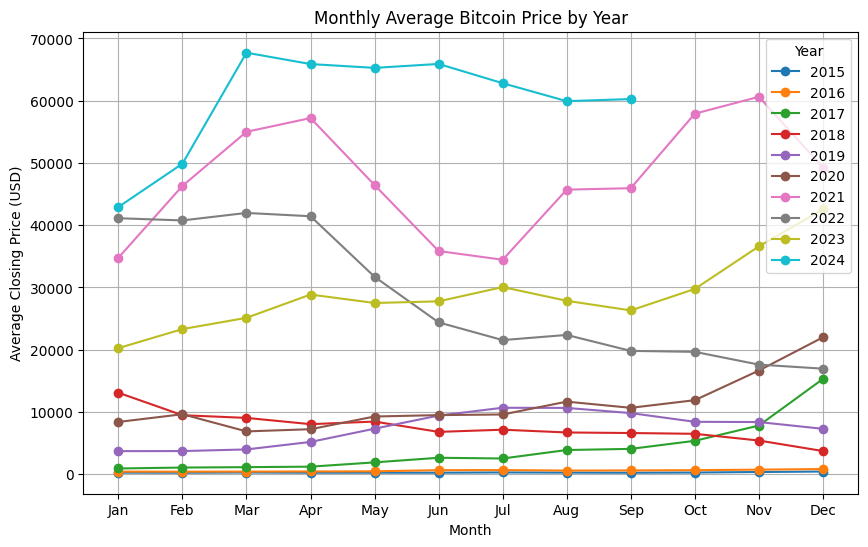

In [25]:
import matplotlib.pyplot as plt

# Plot the monthly average closing prices for each year
plt.figure(figsize=(10, 6))

for year in monthly_avg.columns:
    plt.plot(monthly_avg.index, monthly_avg[year], label=f'{year}', marker='o')

plt.title('Monthly Average Bitcoin Price by Year')
plt.xlabel('Month')
plt.ylabel('Average Closing Price (USD)')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Year')
plt.grid(True)
plt.show()
 

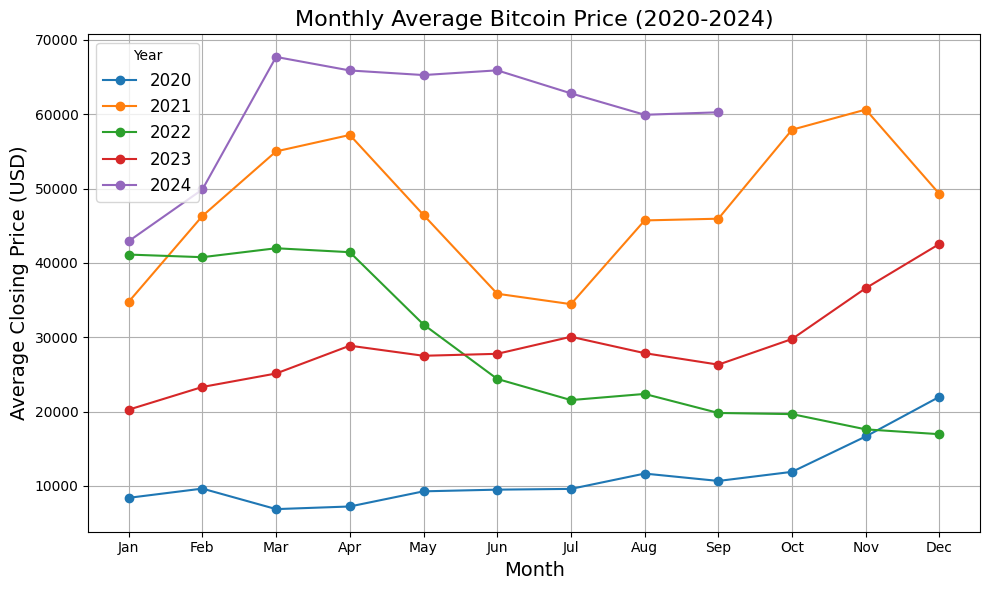

In [26]:
# Filter the columns for years 2020 to 2024
years_to_plot = [2020, 2021, 2022, 2023, 2024]

# Plot the monthly average closing prices for each of the selected years
plt.figure(figsize=(10, 6))

# Track whether any data is plotted
plotted = False

for year in years_to_plot:
    if year in monthly_avg.columns:  # Ensure the year is present in the columns
        plt.plot(monthly_avg.index, monthly_avg[year], label=f'{year}', marker='o')
        plotted = True  # Mark that we successfully plotted something

# Check if any data was plotted before adding the legend
if plotted:
    plt.legend(title='Year', fontsize=12)
else:
    print("No valid data to plot for the selected years.")

# Customize the plot
plt.title('Monthly Average Bitcoin Price (2020-2024)', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Average Closing Price (USD)', fontsize=14)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


In [27]:
# Dictionary to store top 3 months for each year
top_months_per_year = {}

# Filter the columns for years 2020 to 2024
years_to_analyze = [2020, 2021, 2022, 2023, 2024]

for year in years_to_analyze:
    if year in monthly_avg.columns:  # Check if year is present in the DataFrame
        
        # Get the data for the current year and sort it by price in descending order
        year_data = monthly_avg[year].sort_values(ascending=False)
        
        # Extract the top 3 months
        top_3_months = year_data.head(3)
        
        # Store the results in the dictionary
        top_months_per_year[year] = top_3_months

# Display the top 3 months for each year
for year, top_months in top_months_per_year.items():
    print(f"\nTop 3 months for {year}:")
    for month, price in top_months.items():
        print(f"Month: {month}, Average Price: {price:.2f} USD")



Top 3 months for 2020:
Month: 12, Average Price: 21983.14 USD
Month: 11, Average Price: 16645.76 USD
Month: 10, Average Price: 11886.98 USD

Top 3 months for 2021:
Month: 11, Average Price: 60621.49 USD
Month: 10, Average Price: 57911.97 USD
Month: 4, Average Price: 57206.72 USD

Top 3 months for 2022:
Month: 3, Average Price: 41966.24 USD
Month: 4, Average Price: 41435.32 USD
Month: 1, Average Price: 41114.42 USD

Top 3 months for 2023:
Month: 12, Average Price: 42546.89 USD
Month: 11, Average Price: 36596.16 USD
Month: 7, Average Price: 30057.47 USD

Top 3 months for 2024:
Month: 3, Average Price: 67702.44 USD
Month: 6, Average Price: 65899.47 USD
Month: 4, Average Price: 65882.38 USD


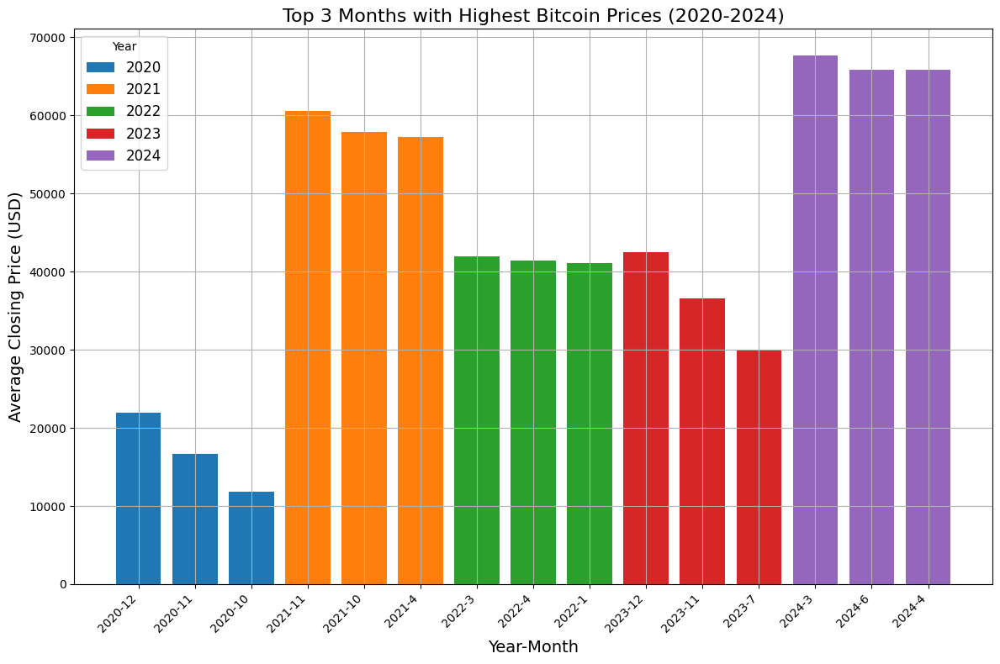

In [28]:
# Dictionary to store top 3 months for each year
top_months_per_year = {}

# Filter the columns for years 2020 to 2024
years_to_analyze = [2020, 2021, 2022, 2023, 2024]

for year in years_to_analyze:
    if year in monthly_avg.columns:  # Check if year is present in the DataFrame
        
        # Get the data for the current year and sort it by price in descending order
        year_data = monthly_avg[year].sort_values(ascending=False)
        
        # Extract the top 3 months
        top_3_months = year_data.head(3)
        
        # Store the results in the dictionary
        top_months_per_year[year] = top_3_months

# Plotting the data
plt.figure(figsize=(12, 8))

for year, top_months in top_months_per_year.items():
    # Plot each year’s top 3 months as a bar chart
    plt.bar([f"{year}-{month}" for month in top_months.index], top_months.values, label=f'{year}')

# Customize the plot
plt.title('Top 3 Months with Highest Bitcoin Prices (2020-2024)', fontsize=16)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Average Closing Price (USD)', fontsize=14)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Year', fontsize=12)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

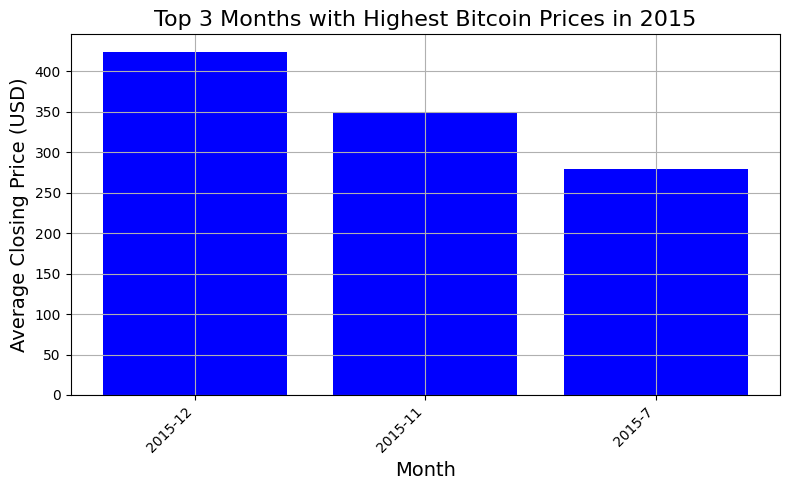

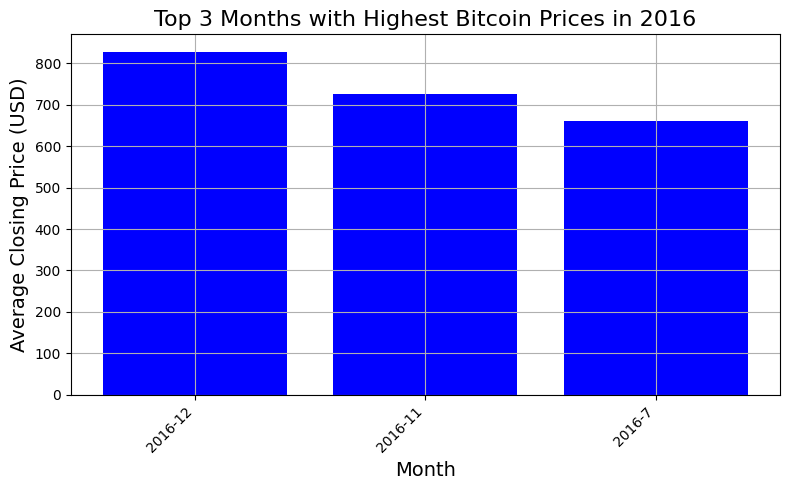

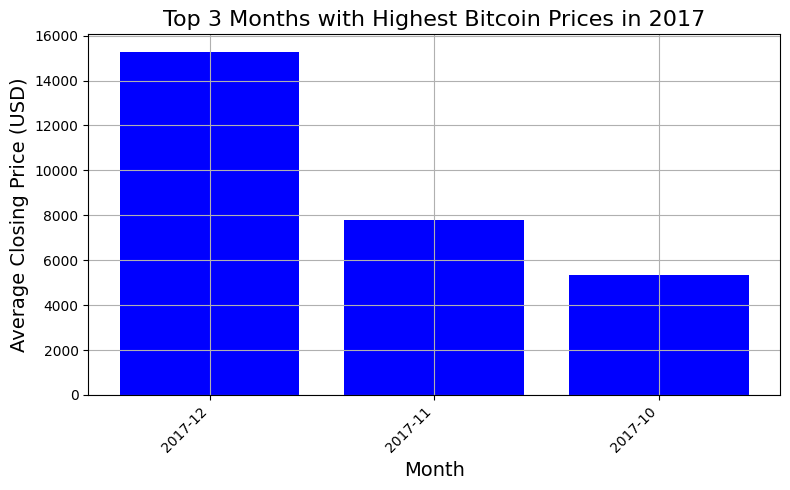

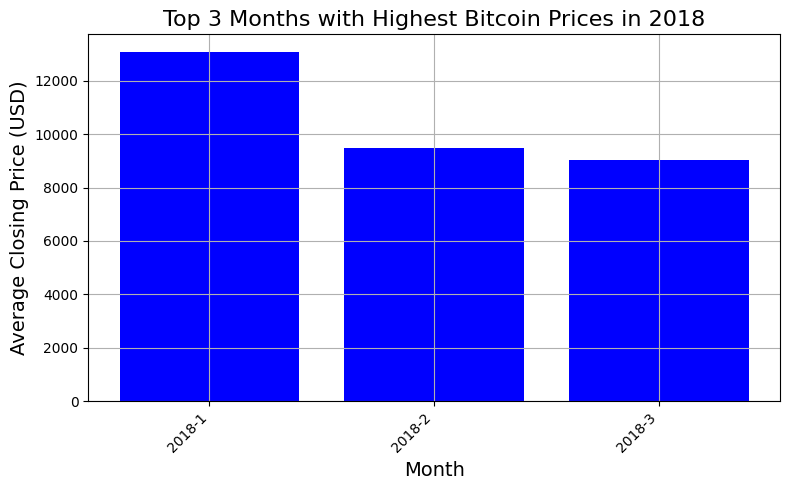

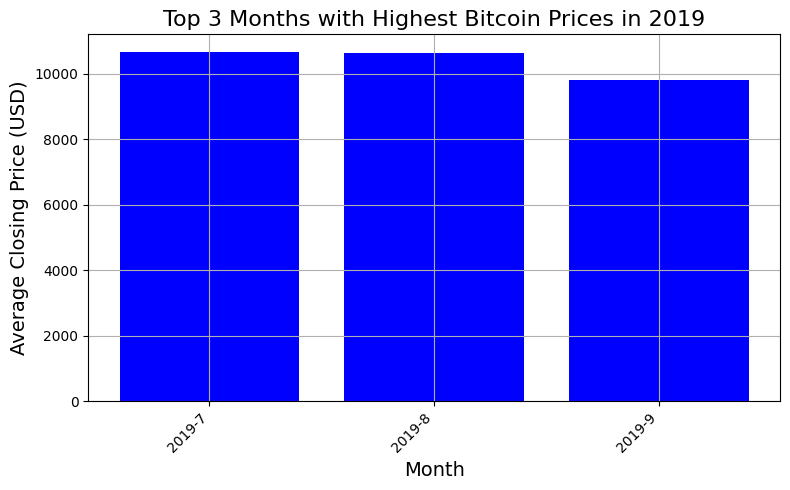

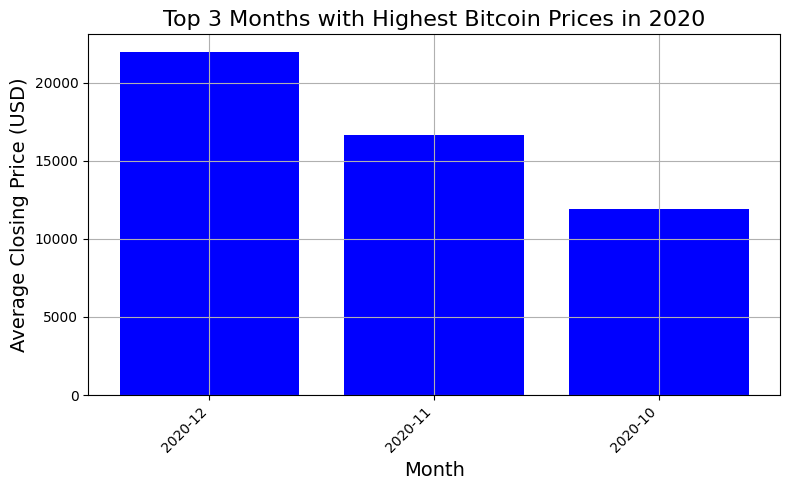

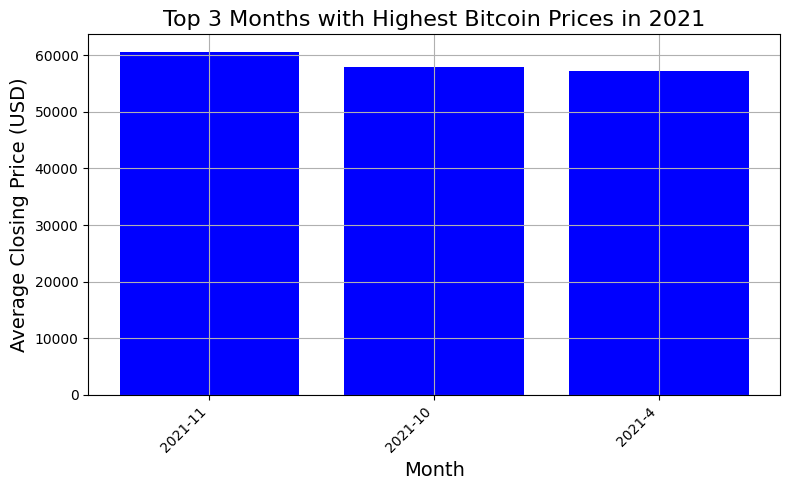

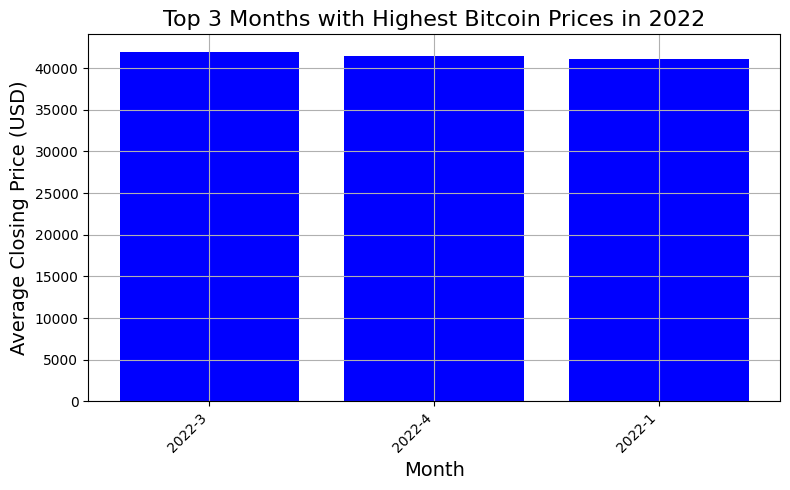

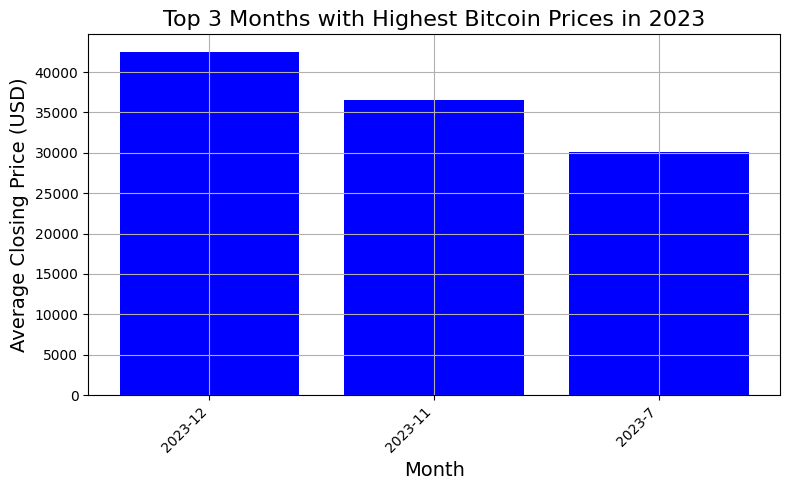

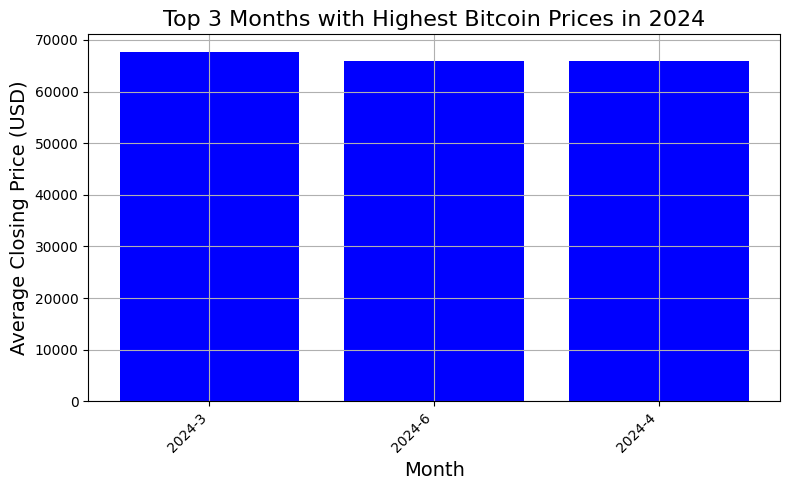

In [29]:
# Dictionary to store top 3 months for each year
top_months_per_year = {}

# Filter the columns for years 2015 to 2024
years_to_analyze = range(2015, 2025)  # From 2015 to 2024

for year in years_to_analyze:
    if year in monthly_avg.columns:  # Check if year is present in the DataFrame
        
        # Get the data for the current year and sort it by price in descending order
        year_data = monthly_avg[year].sort_values(ascending=False)
        
        # Extract the top 3 months
        top_3_months = year_data.head(3)
        
        # Store the results in the dictionary
        top_months_per_year[year] = top_3_months

        # Plot for the current year
        plt.figure(figsize=(8, 5))
        plt.bar([f"{year}-{month}" for month in top_3_months.index], top_3_months.values, color='blue')
        
        # Customize the plot
        plt.title(f'Top 3 Months with Highest Bitcoin Prices in {year}', fontsize=16)
        plt.xlabel('Month', fontsize=14)
        plt.ylabel('Average Closing Price (USD)', fontsize=14)
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.grid(True)

        # Show the plot for the current year
        plt.tight_layout()
        plt.show()


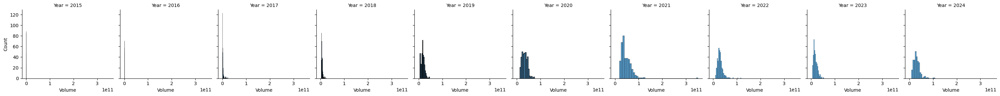

In [30]:
g=sns.FacetGrid(data=df, col="Year")
g.map(sns.histplot, "Volume")

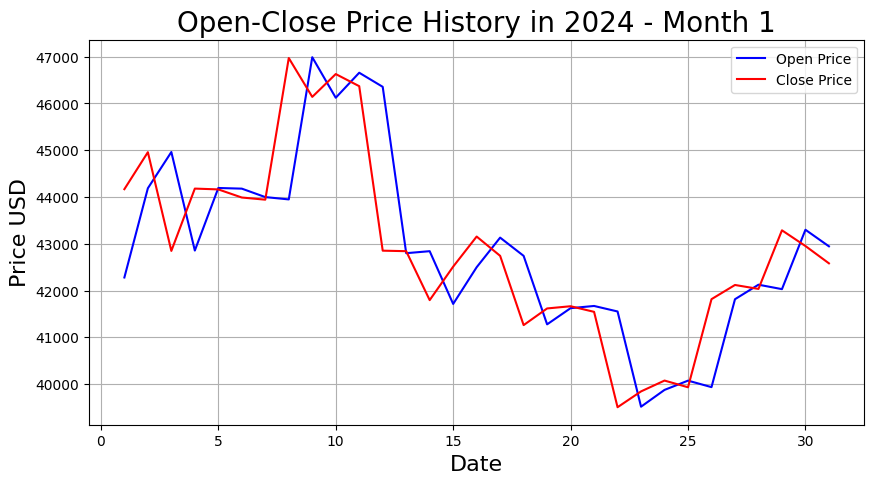

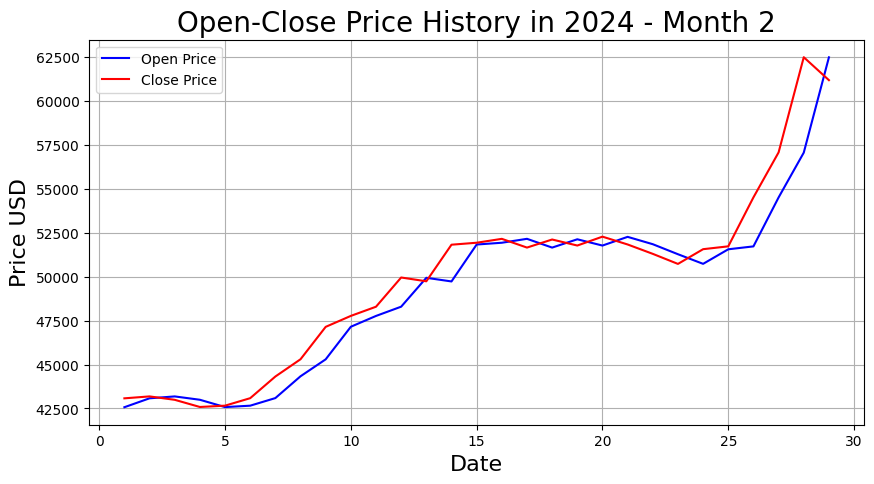

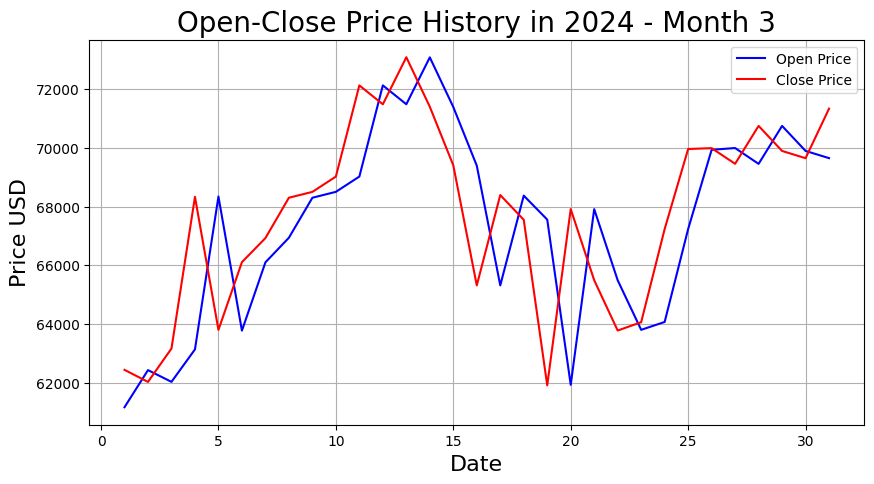

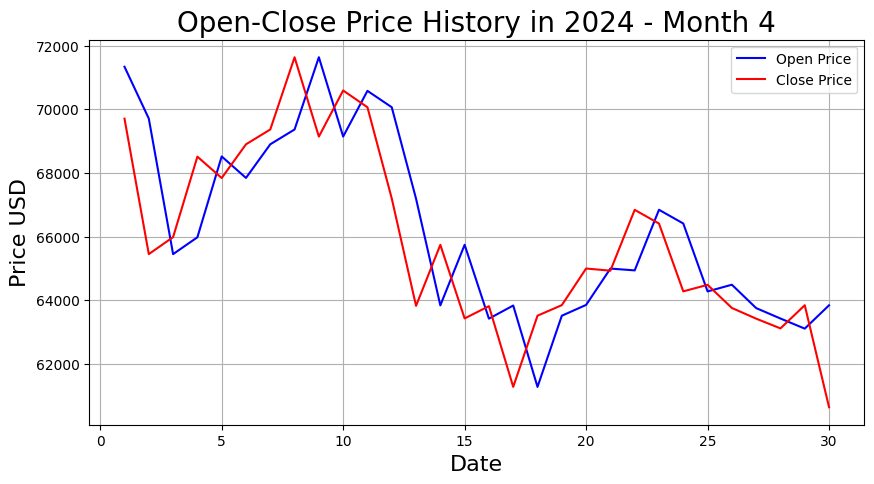

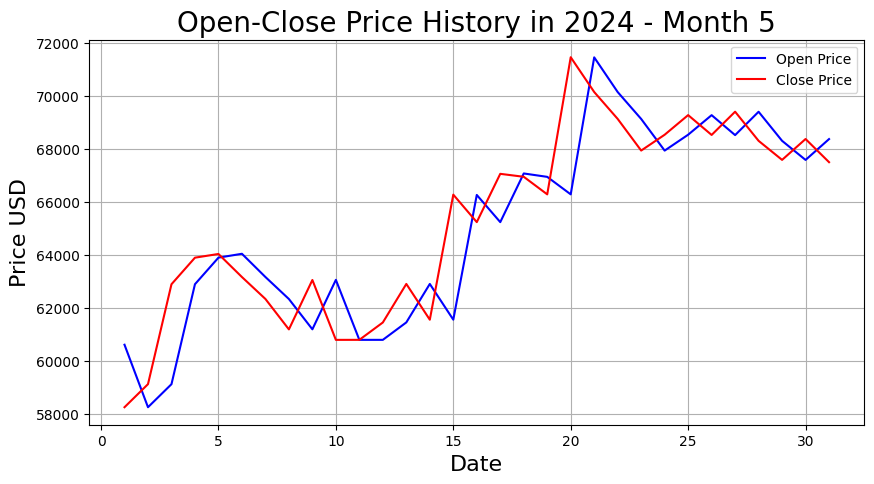

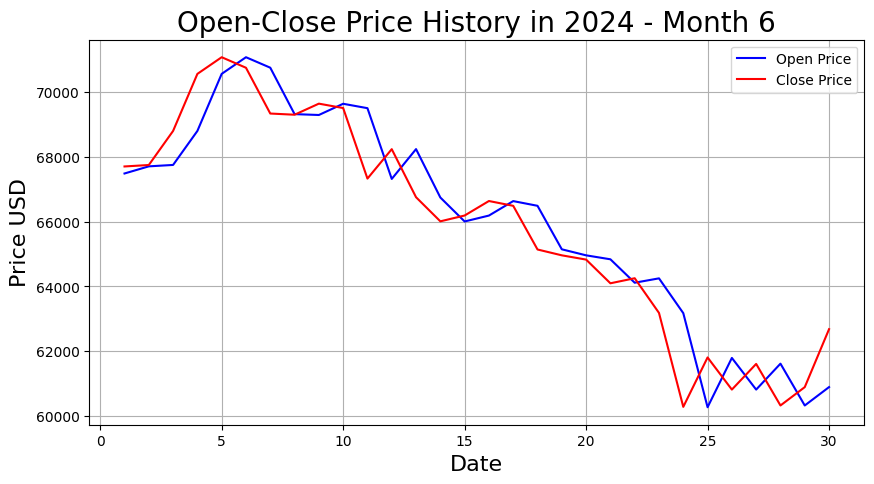

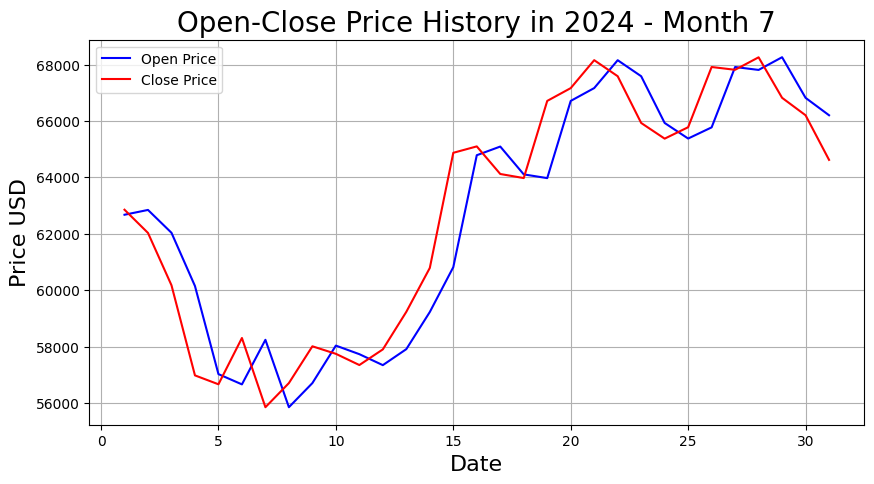

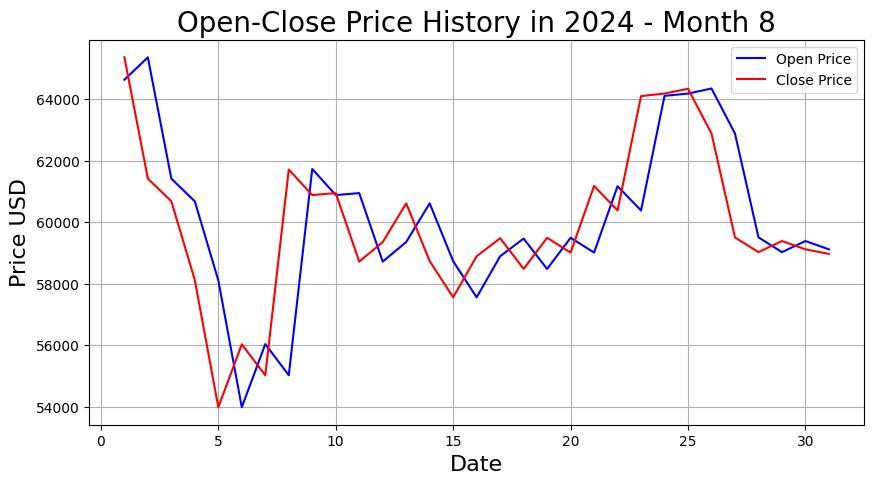

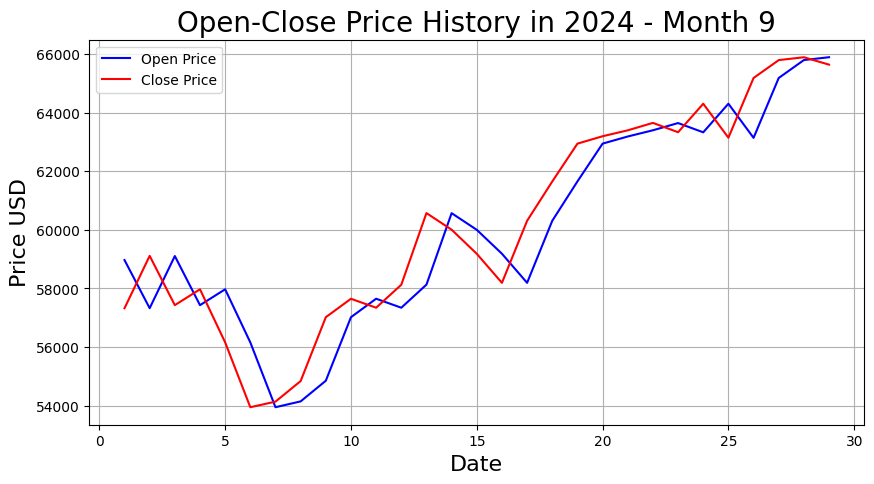

In [31]:
# List of months (1 to 12 for Jan to Dec)
months = range(1, 13)

# Loop through each month and create a plot for Open and Close prices
for month in months:
    # Filter the data for the current month in 2024
    df_month = df_2024[df_2024['Date'].dt.month == month]
    
    # Check if the data for that month exists (avoid empty plots)
    if not df_month.empty:
        # Plot for the month
        plt.figure(figsize=(10, 5))
        plt.title(f'Open-Close Price History in 2024 - Month {month}', fontsize=20)
        
        # Plot Open Prices in blue
        plt.plot(df_month['Day'], df_month['Open'], color='b', label='Open Price')
        
        # Plot Close Prices in red
        plt.plot(df_month['Day'], df_month['Close'], color='r', label='Close Price')
        
        # Customize the plot
        plt.xlabel('Date', fontsize=16)
        plt.ylabel('Price USD', fontsize=16)
        plt.grid(True)
        
        # Add legend
        plt.legend()
        
        # Show the plot for the current month
        plt.show()

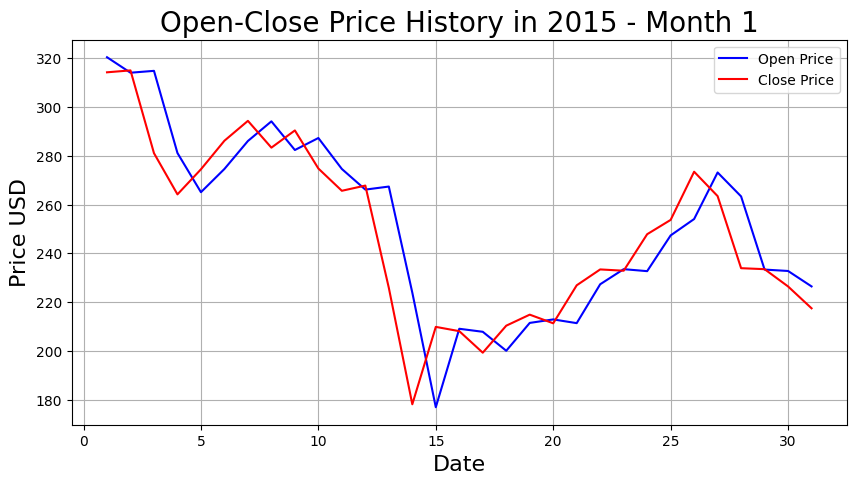

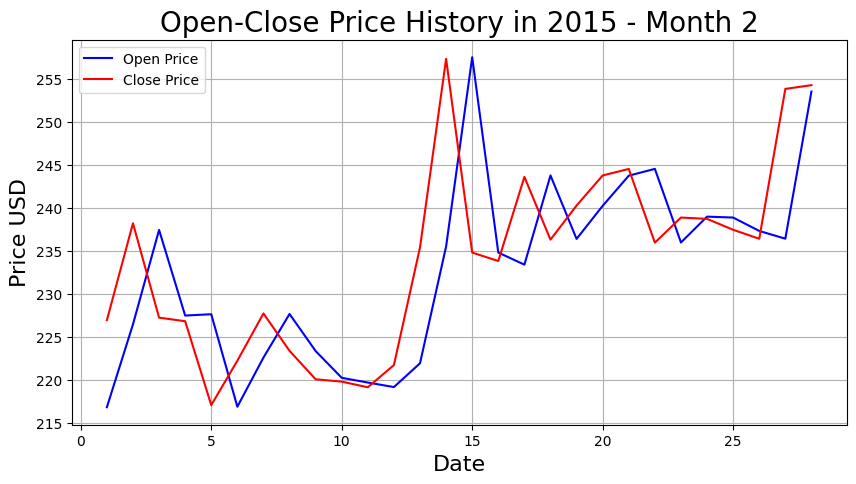

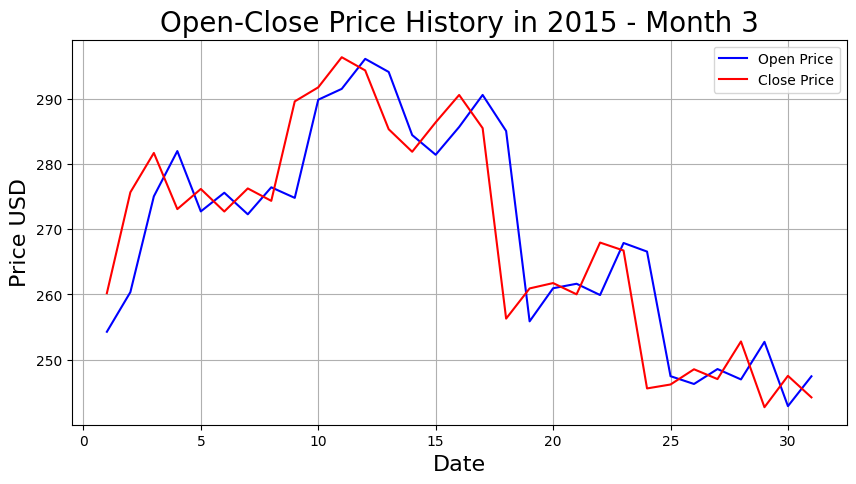

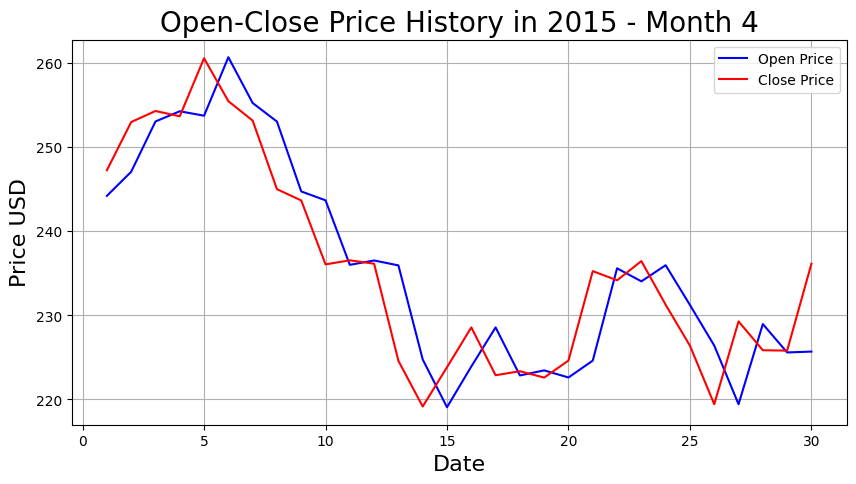

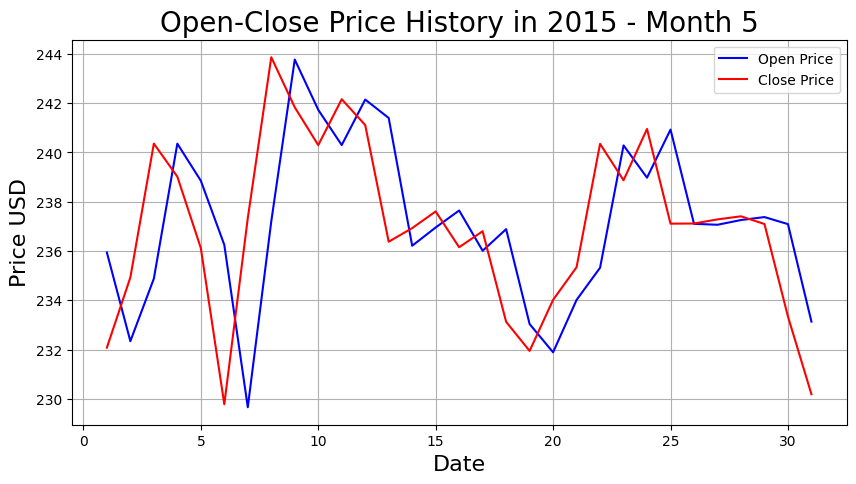

...

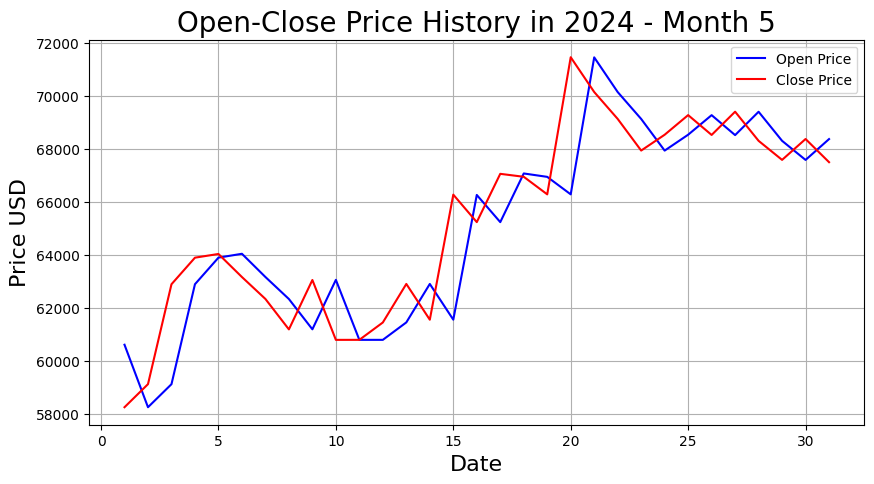

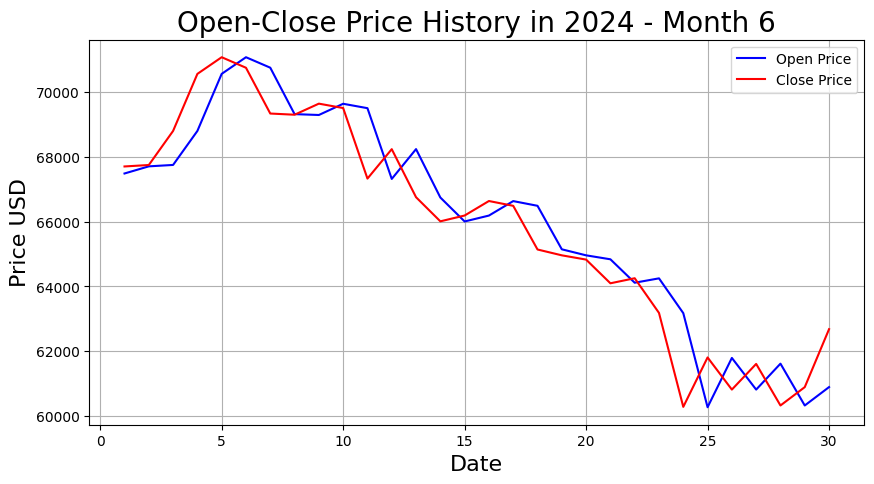

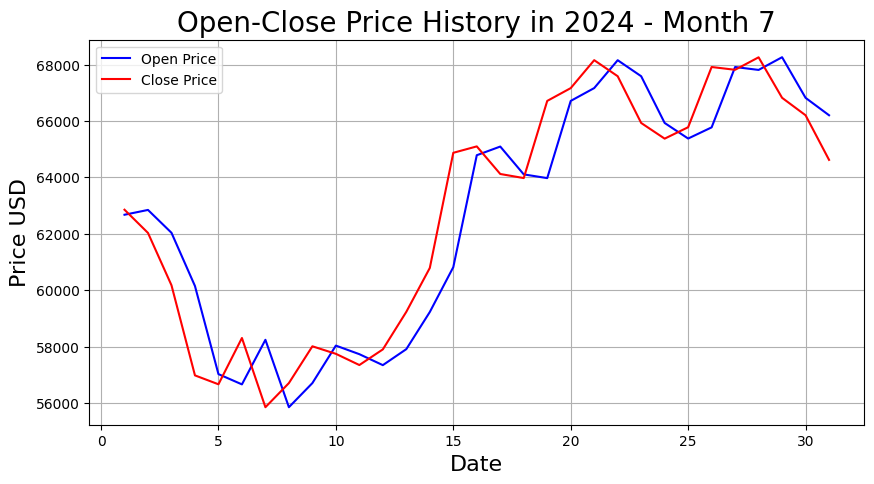

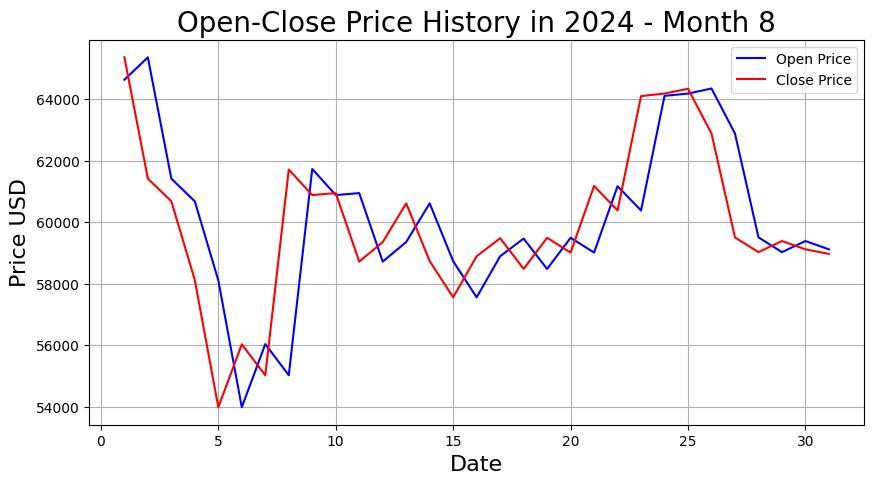

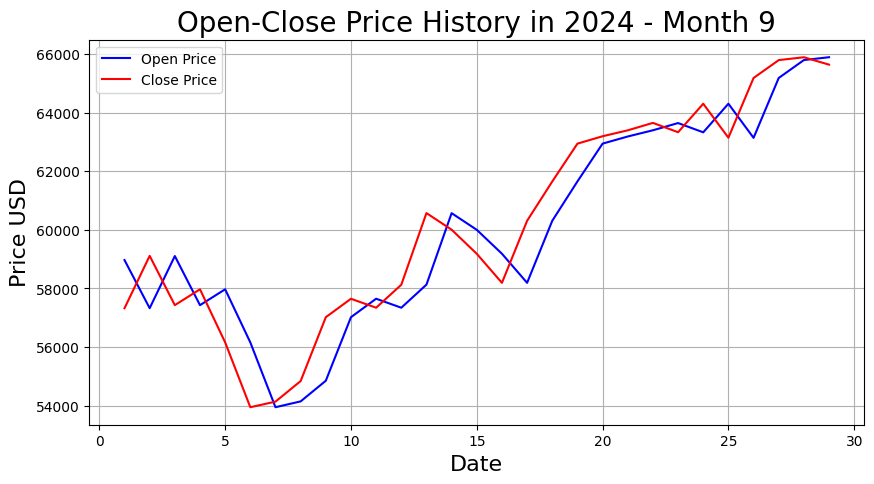

In [32]:
import matplotlib.pyplot as plt

# List of years (from 2015 to 2024)
years = range(2015, 2025)

# Loop through each year and each month
for year in years:
    # Filter the data for the current year
    df_year = df[df['Date'].dt.year == year]
    
    # Loop through each month (1 to 12 for Jan to Dec)
    for month in range(1, 13):
        # Filter the data for the current month in the current year
        df_month = df_year[df_year['Date'].dt.month == month]
        
        # Check if the data for that month exists (avoid empty plots)
        if not df_month.empty:
            # Plot for the month
            plt.figure(figsize=(10, 5))
            plt.title(f'Open-Close Price History in {year} - Month {month}', fontsize=20)
            
            # Plot Open Prices in blue
            plt.plot(df_month['Day'], df_month['Open'], color='b', label='Open Price')
            
            # Plot Close Prices in red
            plt.plot(df_month['Day'], df_month['Close'], color='r', label='Close Price')
            
            # Customize the plot
            plt.xlabel('Date', fontsize=16)
            plt.ylabel('Price USD', fontsize=16)
            plt.grid(True)
            
            # Add legend
            plt.legend()
            
            # Show the plot for the current month and year
            plt.show()

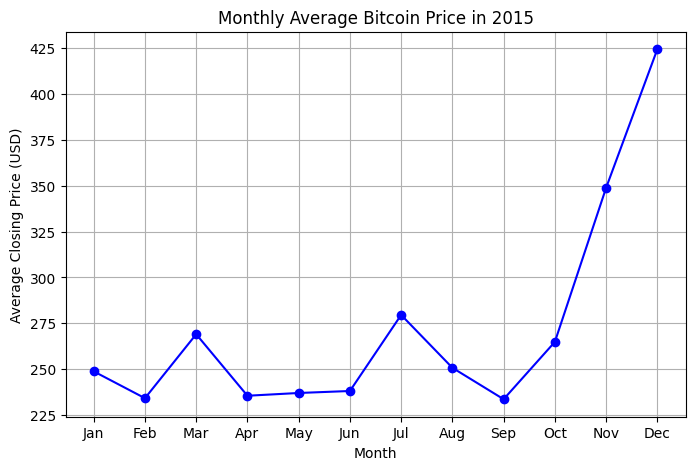

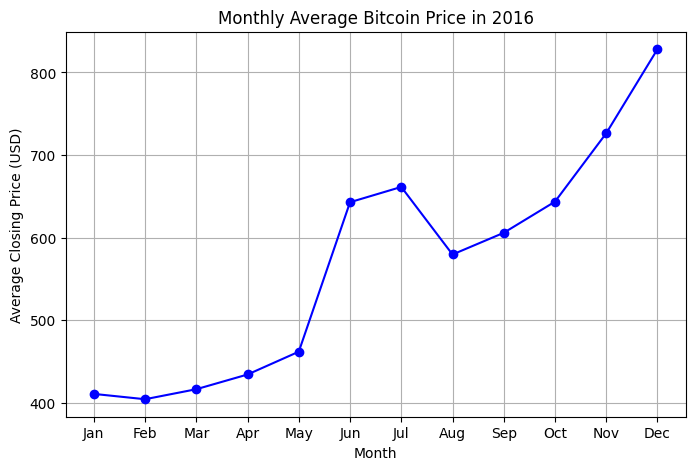

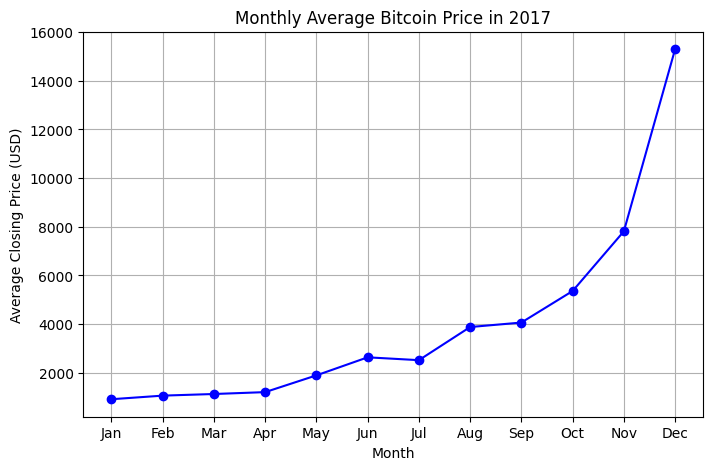

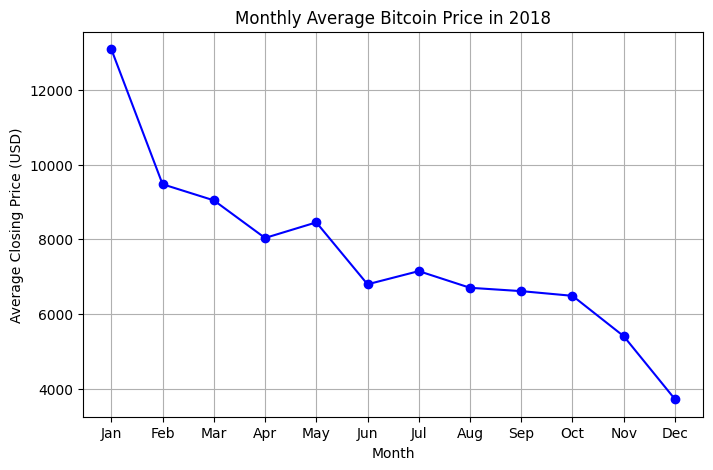

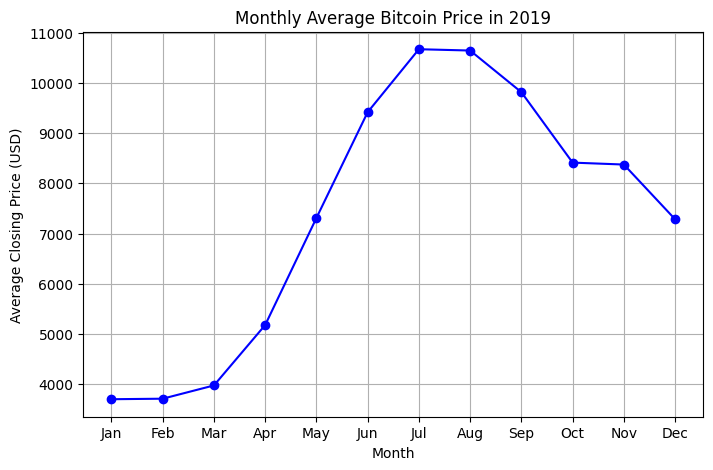

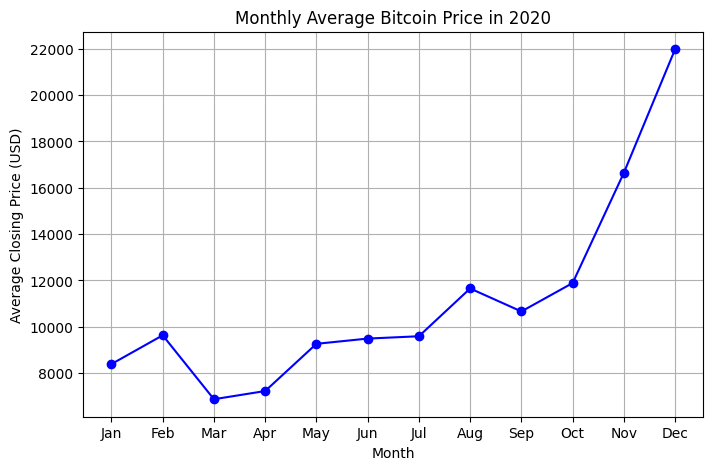

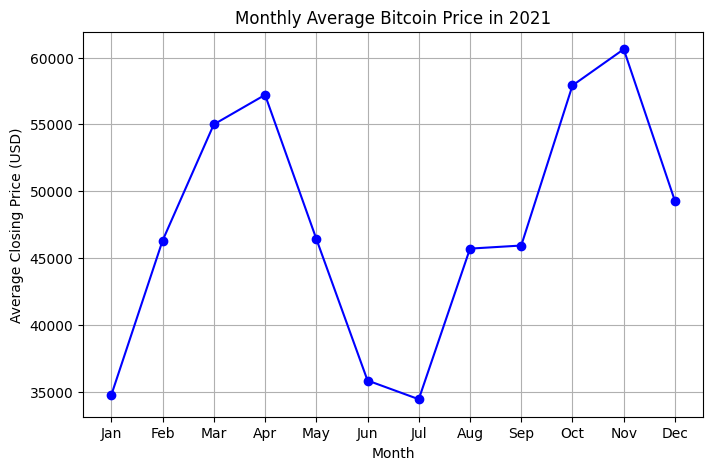

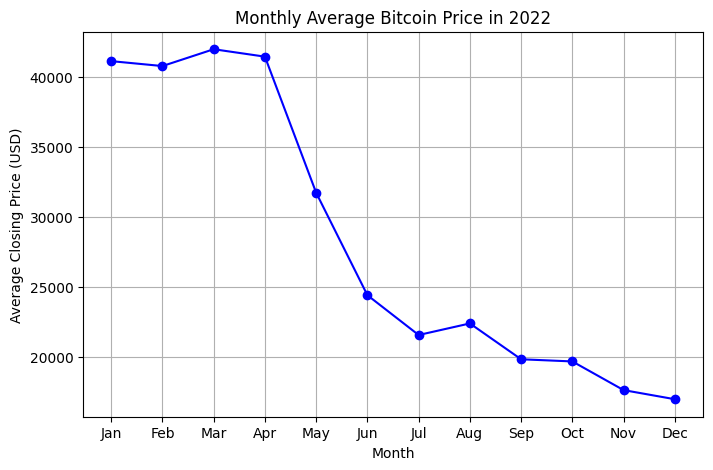

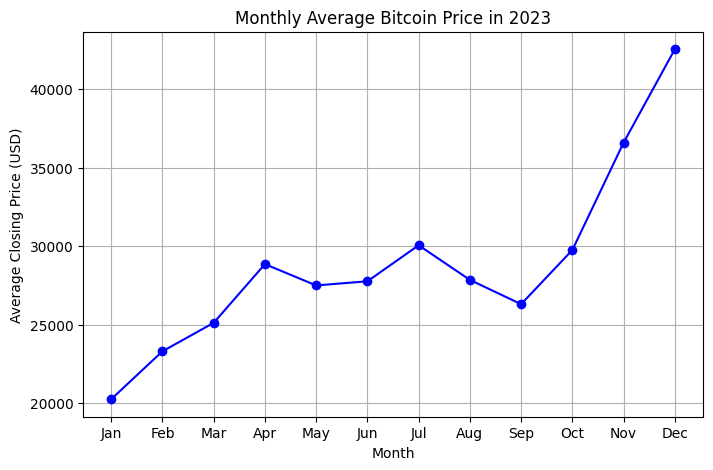

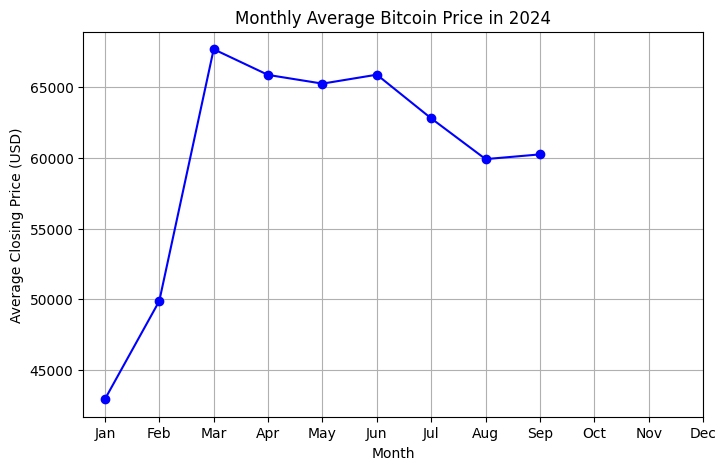

In [33]:
# Get the list of years present in the dataset
years = range(2015, 2025)  # From 2015 to 2024

# Loop through each year and plot
for year in years:
    # Filter the monthly averages for the current year
    monthly_data = monthly_avg[year]
    
    # Create the plot
    plt.figure(figsize=(8, 5))
    plt.plot(monthly_data.index, monthly_data.values, marker='o', color='b')
    
    # Customize the plot
    plt.title(f'Monthly Average Bitcoin Price in {year}')
    plt.xlabel('Month')
    plt.ylabel('Average Closing Price (USD)')
    plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(True)
    
    # Show the plot for the current year
    plt.show()

In [34]:
profit_days=df[df["Open"]<df['Close']].value_counts().sum()
loss_days=df[df["Open"]>df['Close']].value_counts().sum()
neutral_days=df[df["Open"]==df['Close']].value_counts().sum()

In [35]:
profit_days=np.int64(profit_days)
loss_days=np.int64(loss_days)
neutral_days=np.int64(neutral_days)

print('Days of Profit  :{}\nDays of loss    :{}\nDays of Neutral :{}'.format(profit_days, loss_days,neutral_days))

Days of Profit  :1888
Days of loss    :1672
Days of Neutral :0


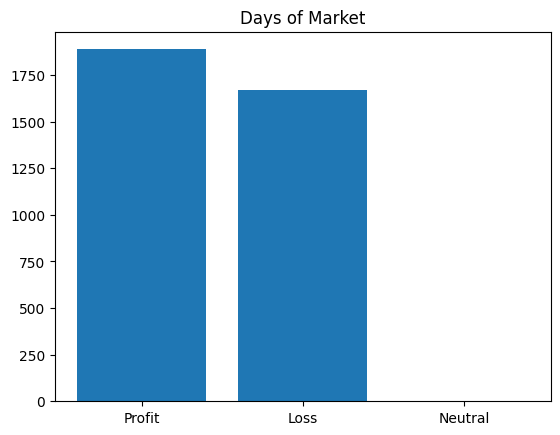

In [36]:
plt.title('Days of Market',fontsize='12')
x=np.array(['Profit','Loss','Neutral'])
y=np.array([profit_days,loss_days,neutral_days])
plt.bar(x,y)
plt.show()

In [37]:
# Create a column for daily returns
df['Daily_Return'] = df['Close'].pct_change()

# Create rolling averages (7-day and 30-day moving averages)
df['7-day MA'] = df['Close'].rolling(window=7).mean()
df['30-day MA'] = df['Close'].rolling(window=30).mean()

In [38]:
df.head()

,Date,Open,High,Low,Close,Volume,Month,Day,Year,Daily_Return,7-day MA,30-day MA
0,2015-01-01,320.434998,320.434998,314.002991,314.248993,8036550,1,1,2015,NaN,NaN,NaN
1,2015-01-02,314.079010,315.838989,313.565002,315.032013,7860650,1,2,2015,0.002492,NaN,NaN
2,2015-01-03,314.846008,315.149994,281.082001,281.082001,33054400,1,3,2015,-0.107767,NaN,NaN
3,2015-01-04,281.145996,287.230011,257.612000,264.195007,55629100,1,4,2015,-0.060079,NaN,NaN
4,2015-01-05,265.084015,278.341003,265.084015,274.473999,43962800,1,5,2015,0.038907,NaN,NaN


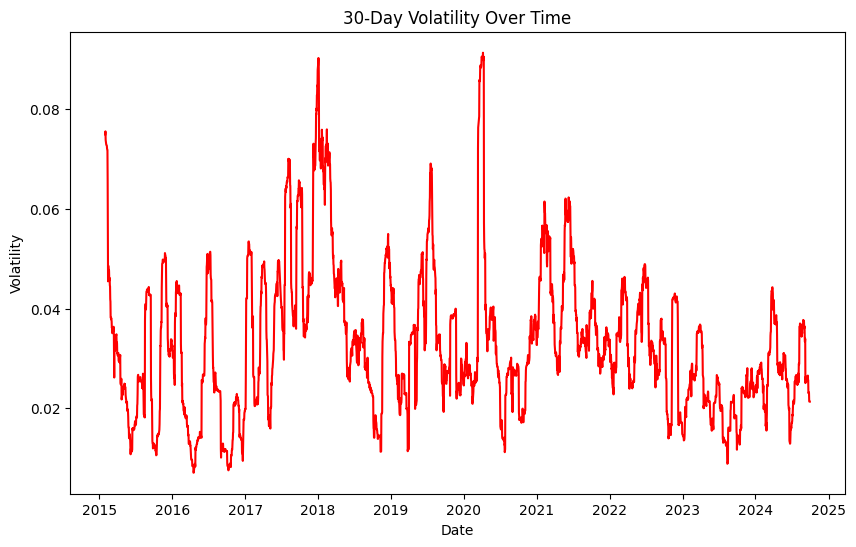

In [39]:
# Calculate 30-day volatility
df['30-day Volatility'] = df['Daily_Return'].rolling(window=30).std()

plt.figure(figsize=(10,6))
plt.plot(df['Date'], df['30-day Volatility'], color='r')
plt.title('30-Day Volatility Over Time')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.show()

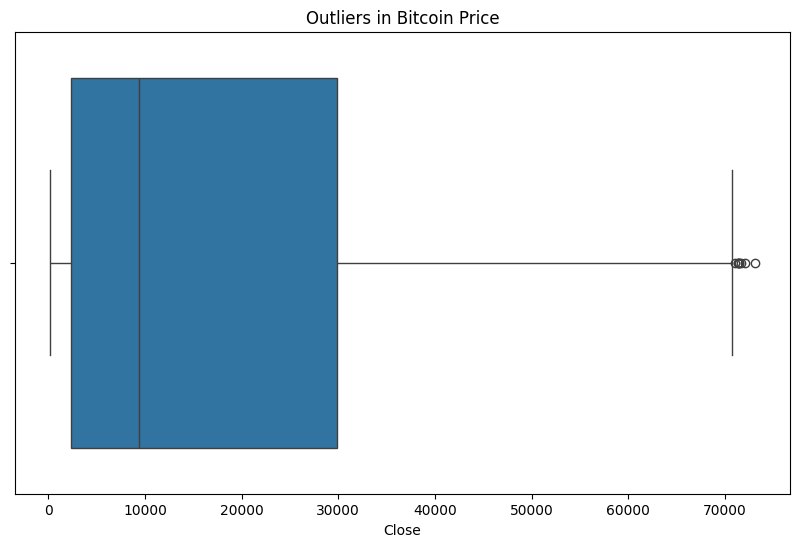

In [40]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df['Close'])
plt.title('Outliers in Bitcoin Price')
plt.show()

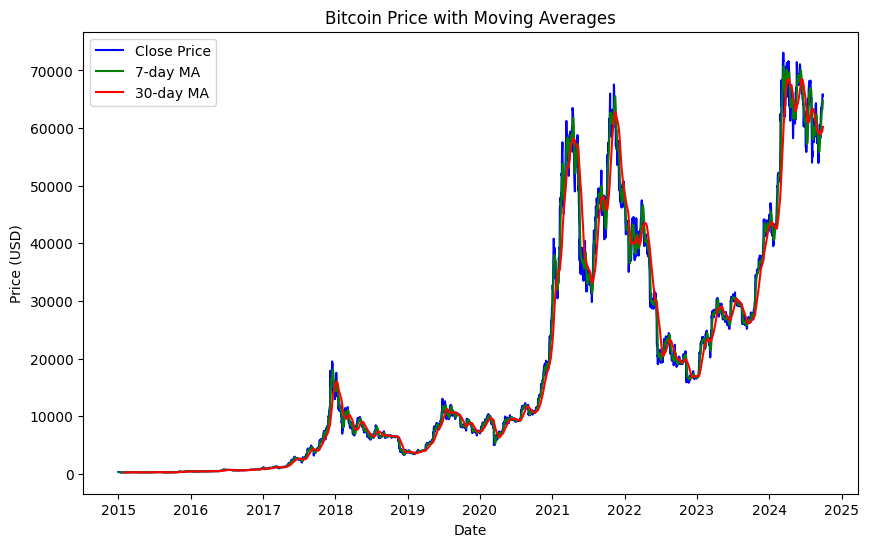

In [41]:
plt.figure(figsize=(10,6))
plt.plot(df['Date'], df['Close'], label='Close Price', color='b')
plt.plot(df['Date'], df['7-day MA'], label='7-day MA', color='g')
plt.plot(df['Date'], df['30-day MA'], label='30-day MA', color='r')
plt.title('Bitcoin Price with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.show()

In [42]:
# Save to CSV
df.to_csv('bitcoin2331.csv', index=False)  

print("CSV file has been saved as 'output.csv'")

CSV file has been saved as 'output.csv'
